# Cellpose-SAM: superhuman generalization for cellular segmentation

### Install Cellpose-SAM

In [3]:
!python3 -m ensurepip --upgrade

Looking in links: /tmp/tmpgux3f1ze
Processing /tmp/tmpgux3f1ze/pip-23.0.1-py3-none-any.whl
zsh:1: command not found: pip


Installing older version of PyTorch for my GTX 1070 Ti

In [4]:
!python3 -m pip install torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cu118

Looking in indexes: https://download.pytorch.org/whl/cu118
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 857.7/857.7 MB 2.4 MB/s eta 0:00:0000:0100:02
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 11.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 11.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 663.9/663.9 MB 2.9 MB/s eta 0:00:0000:0100:03
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.4/209.4 MB 6.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 11.4 MB/s eta 0:00:0000:0100:01
  Obtaining dependency information for networkx from https://download.pytorch.org/whl/networkx-3.5-py3-none-any.whl.metadata
  Obtaining dependency information for filelock from https://download.pytorch.org/whl/filelock-3.19.1-py3-none-any.whl.metadata
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 417.9/417.9 MB 4.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.2/23.2

In [5]:
!python3 -m pip install git+https://www.github.com/mouseland/cellpose.git

  Cloning https://www.github.com/mouseland/cellpose.git to /tmp/pip-req-build-fssp8_0x
  Running command git clone --filter=blob:none --quiet https://www.github.com/mouseland/cellpose.git /tmp/pip-req-build-fssp8_0x
  Resolved https://www.github.com/mouseland/cellpose.git to commit 9604421222c51d96636c2547e33fbd7d4f766c2a
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.7/37.7 MB 10.2 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 226.5/226.5 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.0/54.0 MB 9.8 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 9.3 MB/s eta 0:00:0000:0100:01m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.4/43.4 MB 9.8 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 9.2 MB/s eta 0:00:00a 0:00:01m
  DEPRECATION: cellpose 

Check GPU and instantiate model - will download weights.

In [7]:
!uv add matplotlib

Resolved 110 packages in 433ms                                       
Prepared 6 packages in 3.38s                                             
Uninstalled 2 packages in 64ms
Installed 8 packages in 48ms                                
 + contourpy==1.3.2
 + cycler==0.12.1
 + fonttools==4.60.1
 + kiwisolver==1.4.9
 + matplotlib==3.10.7
 - numpy==2.1.2
 + numpy==2.2.6
 - pillow==11.3.0
 + pillow==12.0.0
 + pyparsing==3.2.5


In [8]:
import numpy as np
from cellpose import models, core, io, plot
from pathlib import Path
from tqdm import trange
import matplotlib.pyplot as plt

io.logger_setup() # run this to get printing of progress

#Check if colab notebook instance has GPU access
if core.use_gpu()==False:
  raise ImportError("No GPU access, change your runtime")

model = models.CellposeModel(gpu=True)

2025-11-12 22:44:25,314 [INFO] WRITING LOG OUTPUT TO /home/andrei/.cellpose/run.log
2025-11-12 22:44:25,315 [INFO] 
cellpose version: 	4.0.8.dev24+g960442122 
platform:       	linux 
python version: 	3.10.17 
torch version:  	2.4.0+cu118
2025-11-12 22:44:25,610 [INFO] ** TORCH CUDA version installed and working. **
2025-11-12 22:44:25,612 [INFO] ** TORCH CUDA version installed and working. **
2025-11-12 22:44:25,614 [INFO] >>>> using GPU (CUDA)
2025-11-12 22:44:29,391 [INFO] >>>> loading model /home/andrei/.cellpose/models/cpsam


### Download example images

100%|██████████████████████████████████████████████████████████████████████████████| 21.3M/21.3M [00:03<00:00, 6.11MB/s]
100%|██████████████████████████████████████████████████████████████████████████████| 1.63M/1.63M [00:00<00:00, 1.83MB/s]


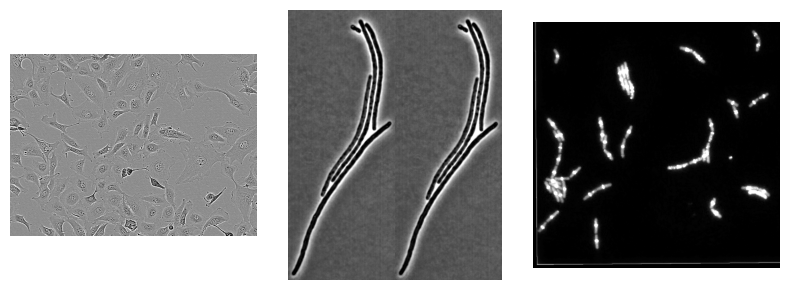

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from cellpose import utils, io

# download example 2D images from website
url = "http://www.cellpose.org/static/data/imgs_cyto3.npz"
filename = "imgs_cyto3.npz"
utils.download_url_to_file(url, filename)

# download 3D tiff
url = "http://www.cellpose.org/static/data/rgb_3D.tif"
utils.download_url_to_file(url, "rgb_3D.tif")

dat = np.load(filename, allow_pickle=True)["arr_0"].item()

imgs = dat["imgs"]
masks_true = dat["masks_true"]

plt.figure(figsize=(8,3))
for i, iex in enumerate([9, 16, 21]):
    img = imgs[iex].squeeze()
    plt.subplot(1,3,1+i)
    plt.imshow(img[0], cmap="gray", vmin=0, vmax=1)
    plt.axis('off')
plt.tight_layout()
plt.show()

### Run Cellpose-SAM

In [10]:
masks_pred, flows, styles = model.eval(imgs, niter=1000) # using more iterations for bacteria


2025-11-12 22:47:45,265 [INFO] 100%|##########| 24/24 [01:43<00:00,  4.32s/it]


plot results

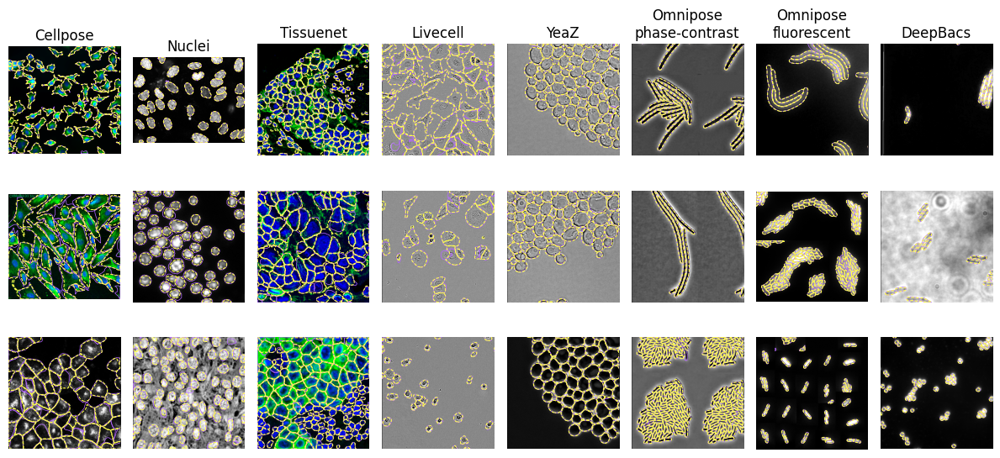

In [11]:
from cellpose import transforms, plot

titles = [
        "Cellpose", "Nuclei", "Tissuenet", "Livecell", "YeaZ",
         "Omnipose\nphase-contrast", "Omnipose\nfluorescent",
        "DeepBacs"
    ]

plt.figure(figsize=(12,6))
ly = 400
for iex in range(len(imgs)):
    img = imgs[iex].squeeze().copy()
    img = np.clip(transforms.normalize_img(img, axis=0), 0, 1) # normalize images across channel axis
    ax = plt.subplot(3, 8, (iex%3)*8 + (iex//3) +1)
    if img[1].sum()==0:
        img = img[0]
        ax.imshow(img, cmap="gray")
    else:
        # make RGB from 2 channel image
        img = np.concatenate((np.zeros_like(img)[:1], img), axis=0).transpose(1,2,0)
        ax.imshow(img)
    ax.set_ylim([0, min(400, img.shape[0])])
    ax.set_xlim([0, min(400, img.shape[1])])


    # GROUND-TRUTH = PURPLE
    # PREDICTED = YELLOW
    outlines_gt = utils.outlines_list(masks_true[iex])
    outlines_pred = utils.outlines_list(masks_pred[iex])
    for o in outlines_gt:
        plt.plot(o[:,0], o[:,1], color=[0.7,0.4,1], lw=0.5)
    for o in outlines_pred:
        plt.plot(o[:,0], o[:,1], color=[1,1,0.3], lw=0.75, ls="--")
    plt.axis('off')

    if iex%3 == 0:
        ax.set_title(titles[iex//3])

plt.tight_layout()
plt.show()

### Applying Cellpose-SAM on our pictures

In [13]:
!unzip content/SAM_Test_Images.zip -d content

Archive:  content/SAM_Test_Images.zip
   creating: content/SAM_Test_Images/
   creating: content/SAM_Test_Images/153/
  inflating: content/SAM_Test_Images/153/153_1.png  
  inflating: content/SAM_Test_Images/153/153_3.png  
  inflating: content/SAM_Test_Images/153/153_6.png  
   creating: content/SAM_Test_Images/154/
  inflating: content/SAM_Test_Images/154/154_1.png  
  inflating: content/SAM_Test_Images/154/154_2.png  
  inflating: content/SAM_Test_Images/154/154_5.png  
   creating: content/SAM_Test_Images/156/
  inflating: content/SAM_Test_Images/156/156_1.png  
  inflating: content/SAM_Test_Images/156/156_3.png  
  inflating: content/SAM_Test_Images/156/156_6.png  
   creating: content/SAM_Test_Images/157/
  inflating: content/SAM_Test_Images/157/157_1.png  
  inflating: content/SAM_Test_Images/157/157_3.png  
  inflating: content/SAM_Test_Images/157/157_6.png  
   creating: content/SAM_Test_Images/160/
  inflating: content/SAM_Test_Images/160/160_1.png  
  inflating: content/SAM_

Try to use red channel & grayscale

Found 27 PNG-files.
2025-11-12 23:22:46,740 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:22:53,415 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


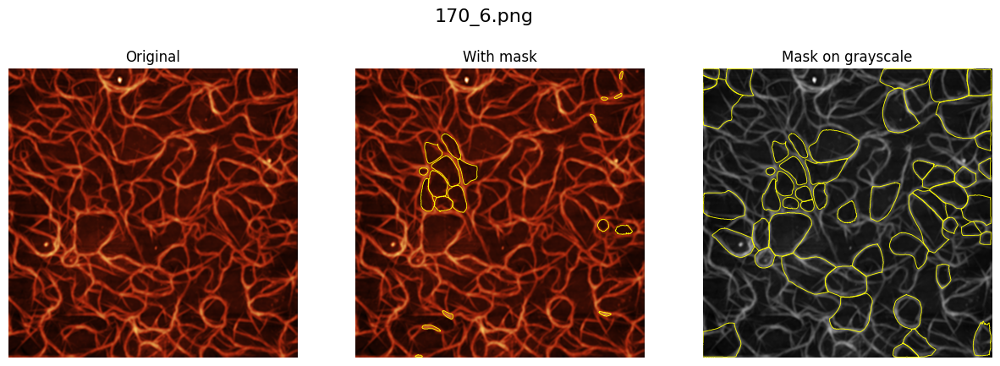

2025-11-12 23:23:03,437 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:23:10,607 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


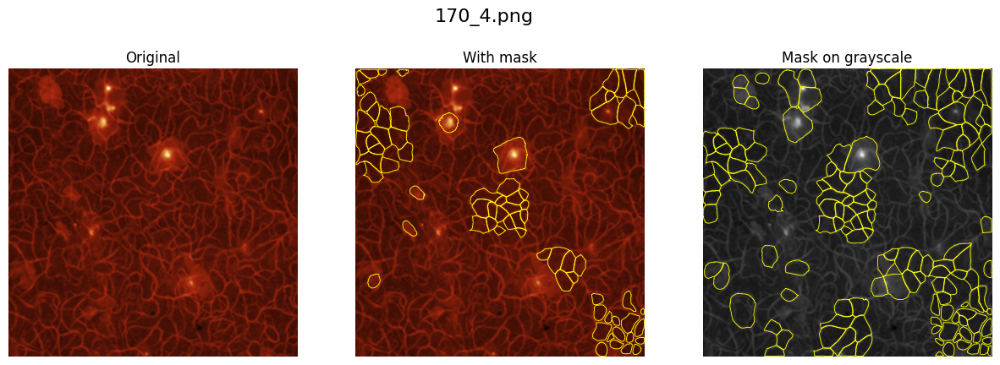

2025-11-12 23:23:19,631 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:23:26,729 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


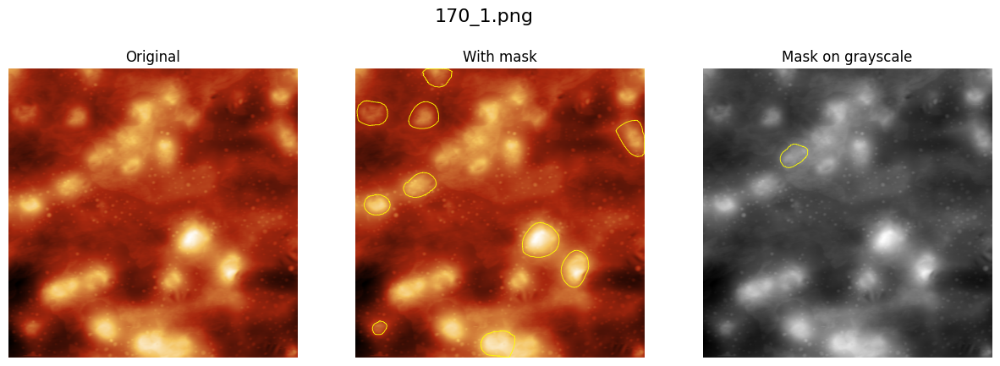

2025-11-12 23:23:34,131 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:23:42,826 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


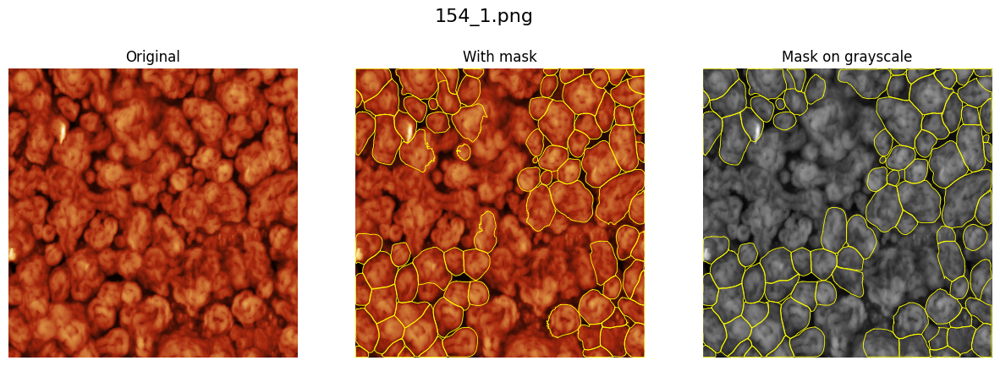

2025-11-12 23:23:52,157 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:24:00,759 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


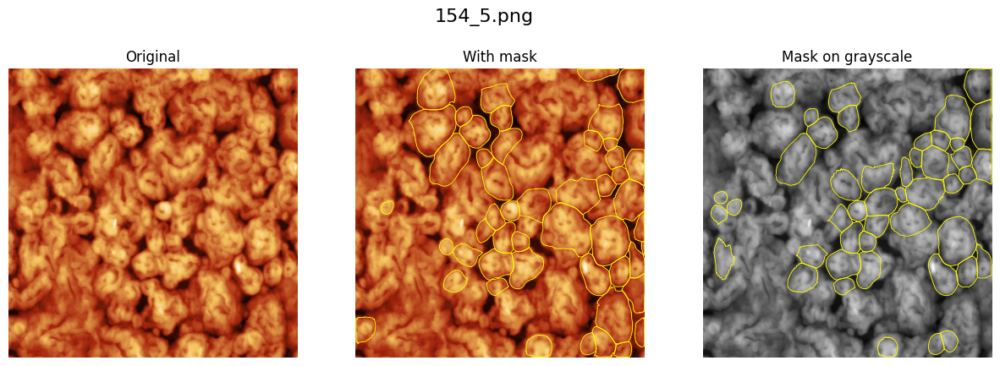

2025-11-12 23:24:08,978 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:24:17,014 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


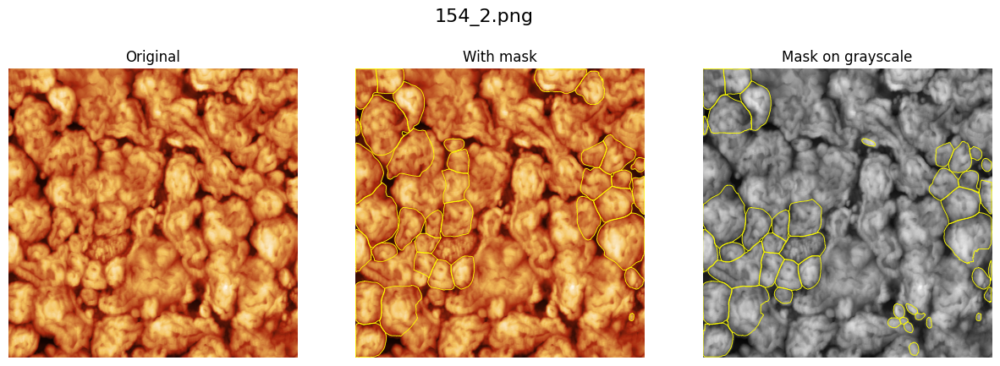

2025-11-12 23:24:25,249 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:24:33,040 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


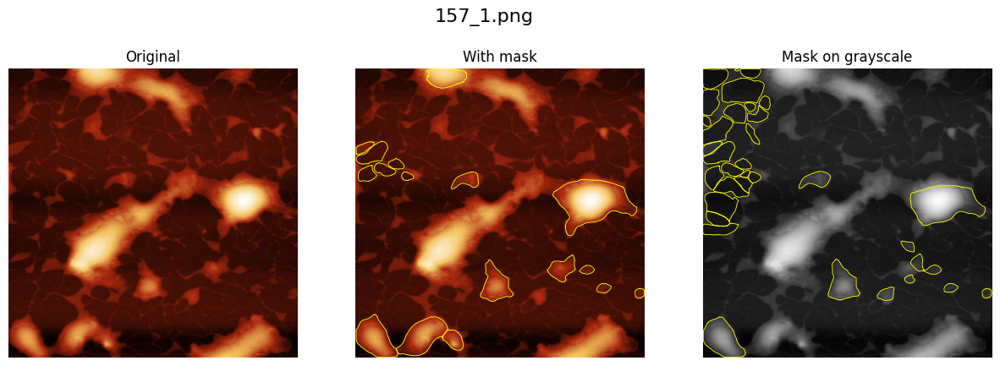

2025-11-12 23:24:40,723 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:24:47,441 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


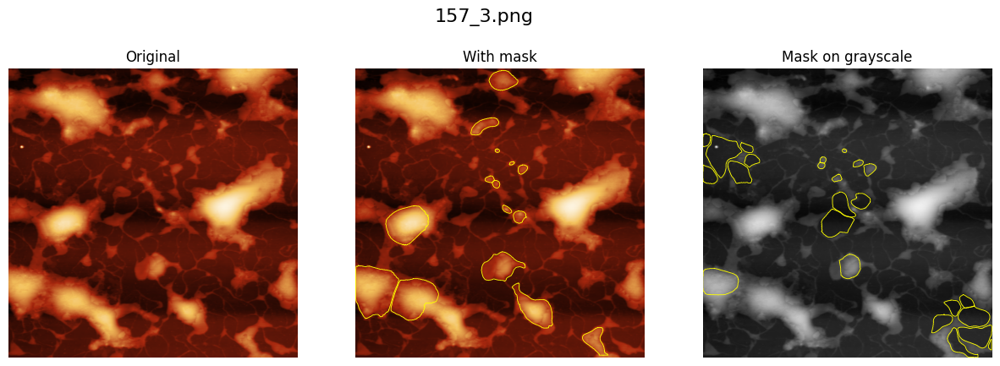

2025-11-12 23:24:54,648 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:25:01,567 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


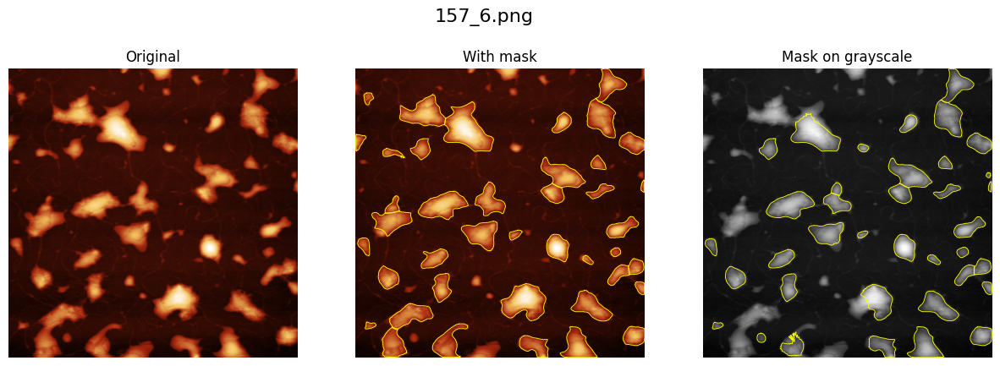

2025-11-12 23:25:09,399 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:25:16,928 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


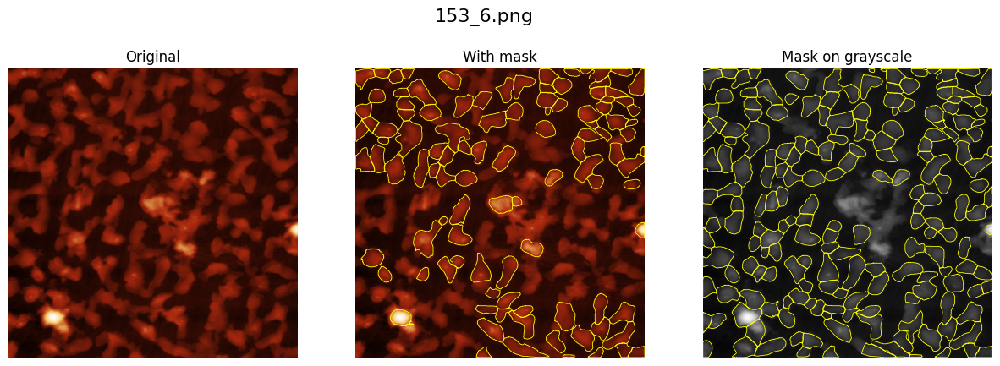

2025-11-12 23:25:25,466 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:25:33,106 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


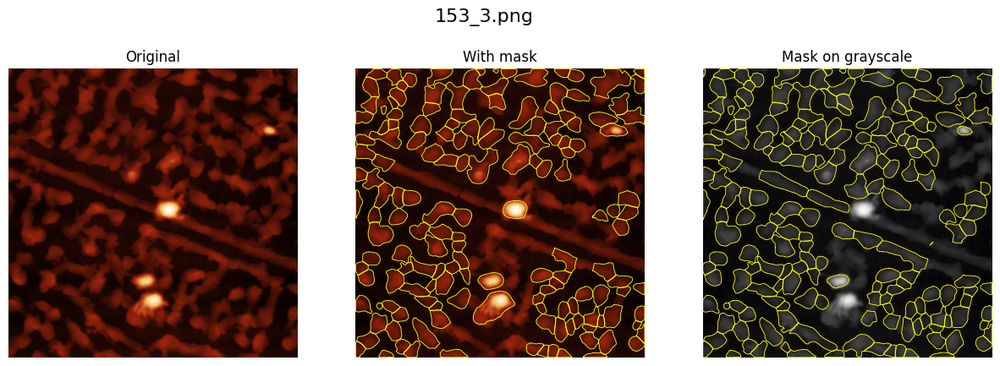

2025-11-12 23:25:42,776 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:25:49,549 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


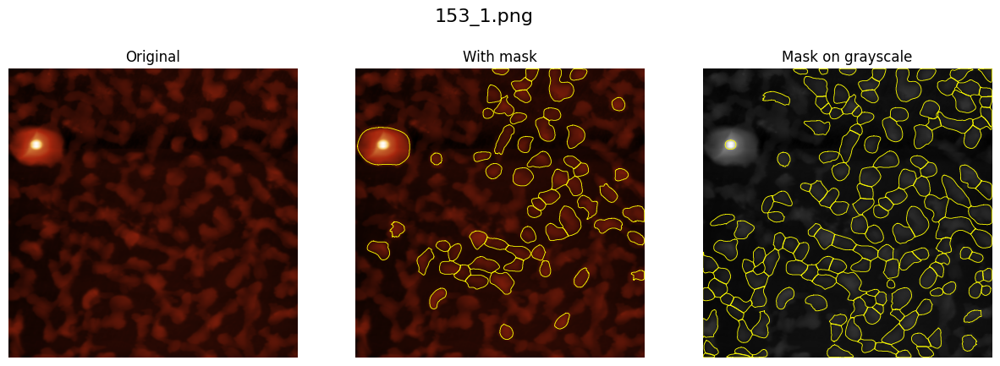

2025-11-12 23:25:57,510 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:26:05,107 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


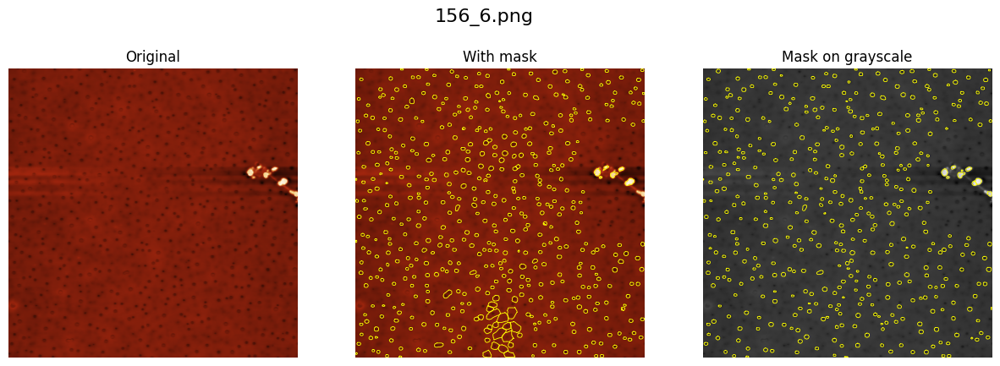

2025-11-12 23:26:14,245 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:26:23,326 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


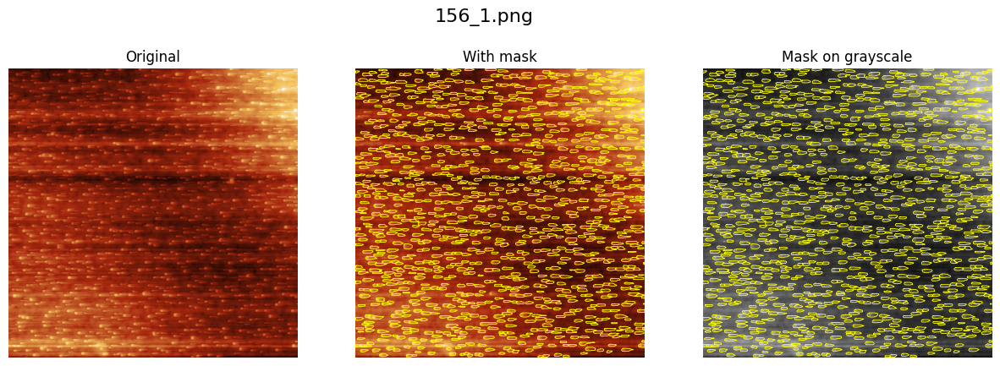

2025-11-12 23:26:35,767 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:26:42,179 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


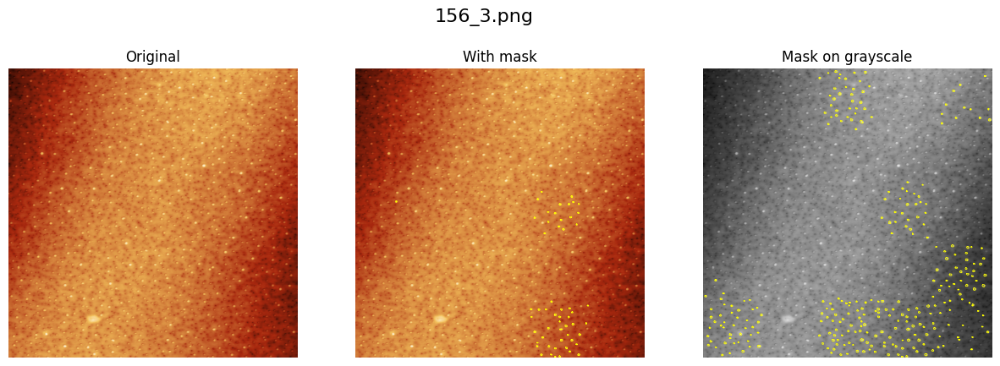

2025-11-12 23:26:50,372 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:26:57,579 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


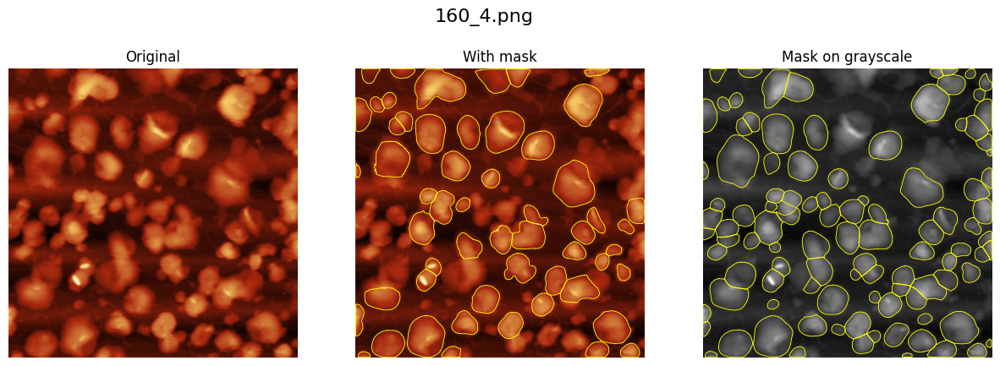

2025-11-12 23:27:06,033 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:27:13,908 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


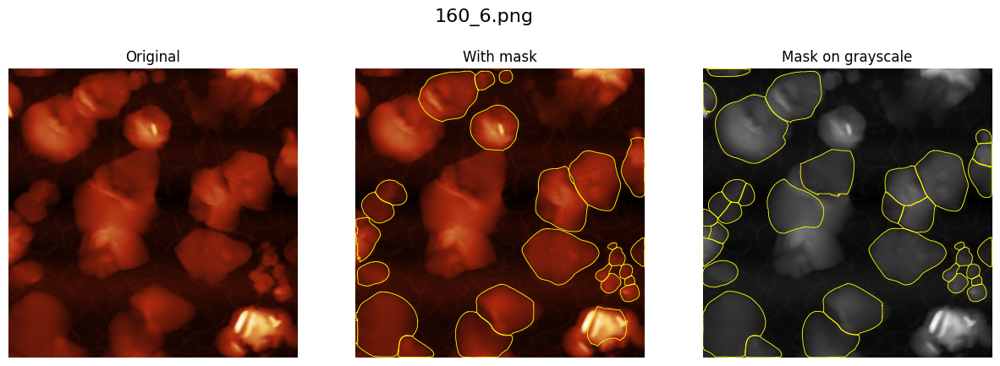

2025-11-12 23:27:23,118 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:27:30,148 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


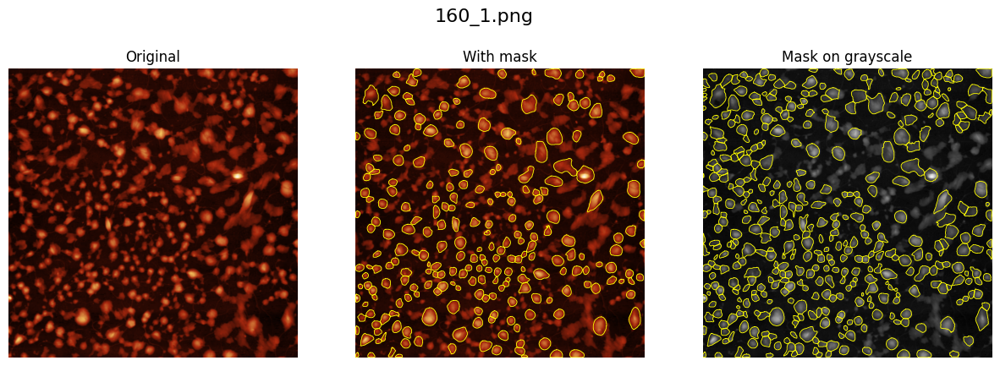

2025-11-12 23:27:39,352 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:27:45,891 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


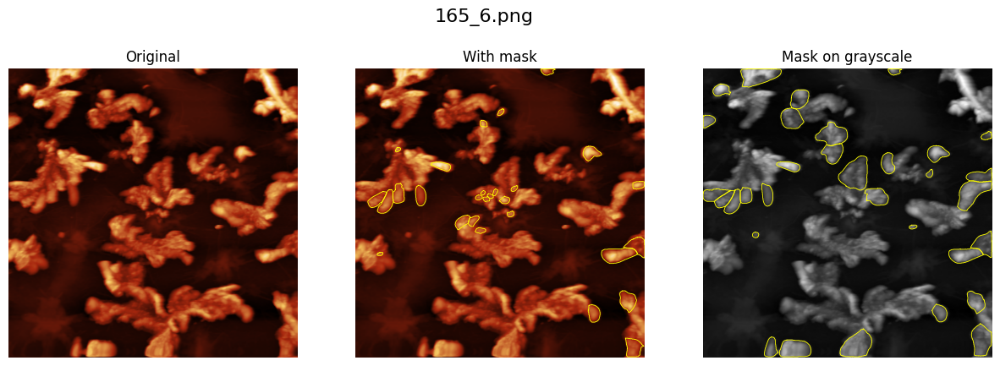

2025-11-12 23:27:53,780 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:28:00,264 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


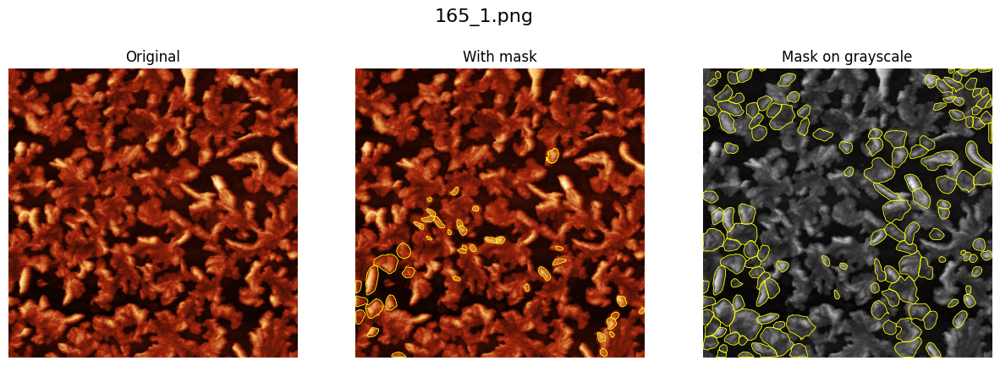

2025-11-12 23:28:08,354 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:28:14,833 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


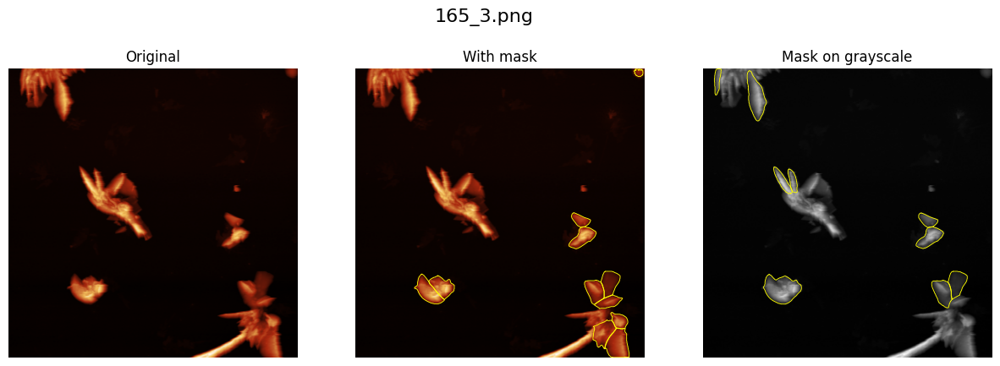

2025-11-12 23:28:22,455 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:28:29,778 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


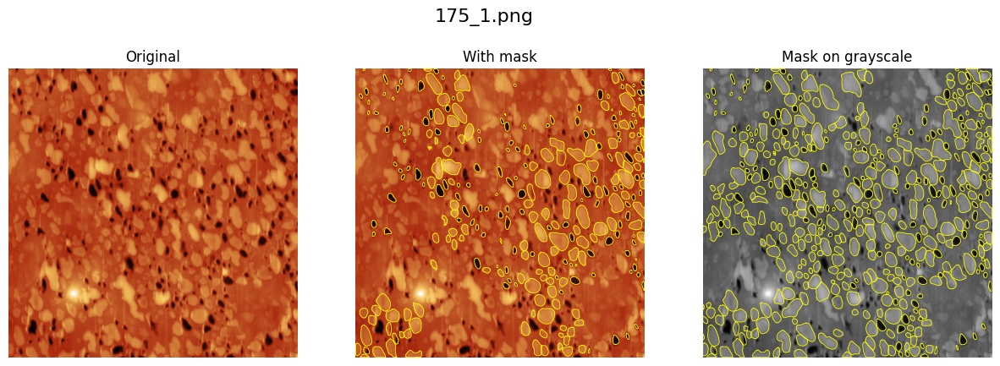

2025-11-12 23:28:39,564 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:28:46,710 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


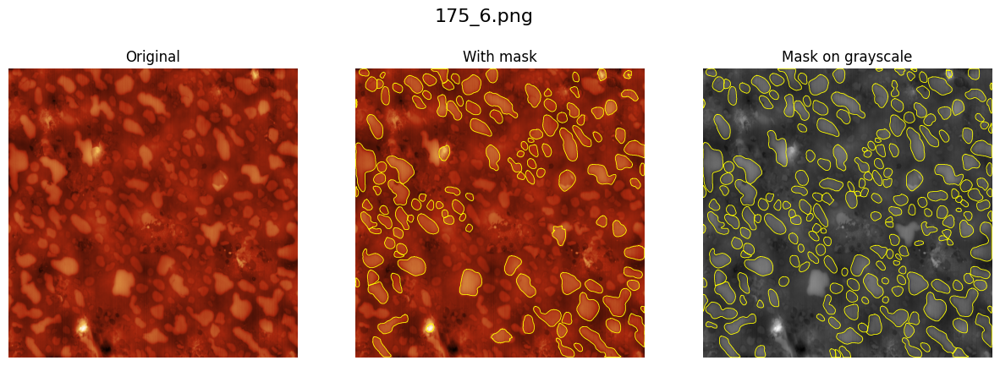

2025-11-12 23:28:55,519 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:29:02,711 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


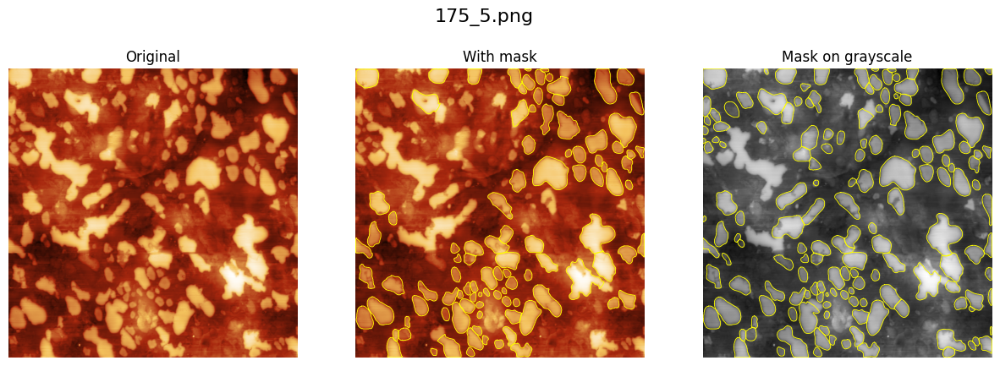

2025-11-12 23:29:10,888 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:29:18,121 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


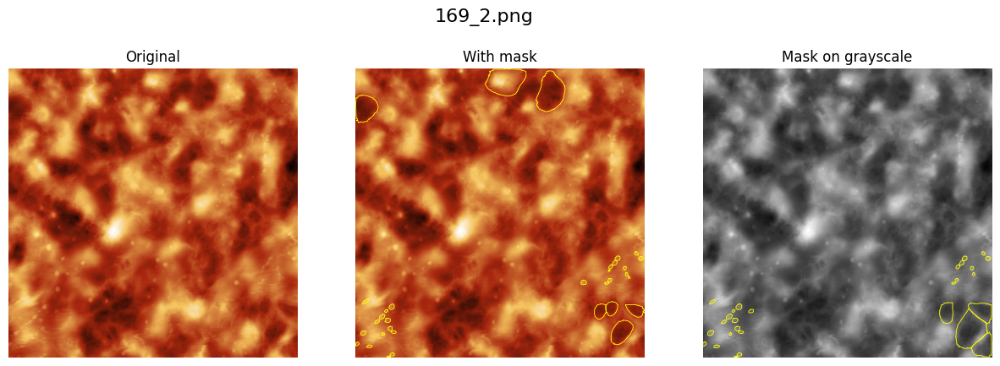

2025-11-12 23:29:25,328 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:29:32,455 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


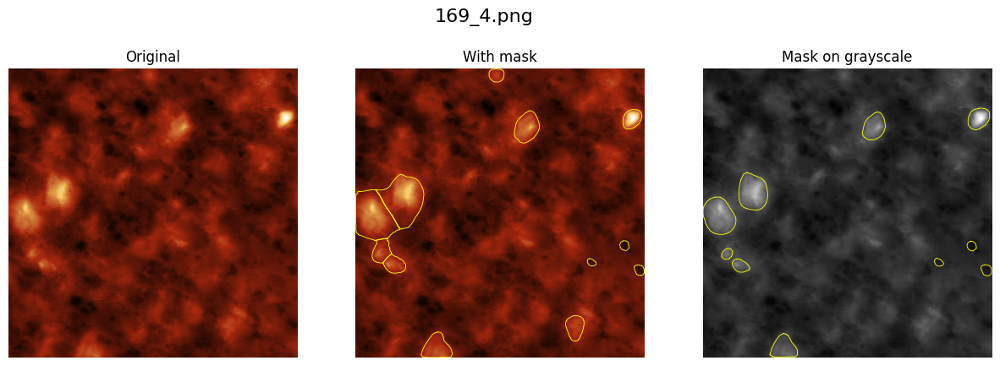

2025-11-12 23:29:39,415 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used
2025-11-12 23:29:46,363 [WARNING] channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


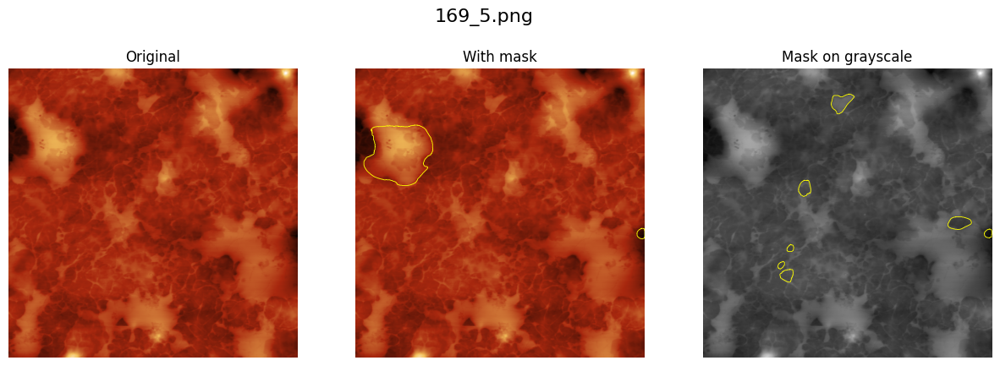

In [20]:
import os
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from cellpose import models, io, utils

base_dir = Path("content")
image_files = list(base_dir.rglob("*.png"))
print(f"Found {len(image_files)} PNG-files.")

for img_path in image_files:
    img = io.imread(img_path)

    # --- Option 1: mask on the original picture ---
    masks_orig, flows, styles = model.eval([img], channels=[0,0])
    mask_orig = masks_orig[0]
    outlines_orig = utils.outlines_list(mask_orig)

    # --- Option 2: grayscale mask ---
    if img.ndim == 3 and img.shape[2] == 3:
        img_gray = np.mean(img, axis=2)
    else:
        img_gray = img
    
    masks_gray, flows_gray, styles_gray = model.eval([img_gray], channels=[0,0])
    mask_gray = masks_gray[0]
    outlines_gray = utils.outlines_list(mask_gray)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    if img.ndim == 3:
        axes[0].imshow(img)
    else:
        axes[0].imshow(img, cmap='gray')
    axes[0].set_title("Original")
    axes[0].axis('off')

    if img.ndim == 3:
        axes[1].imshow(img)
    else:
        axes[1].imshow(img, cmap='gray')
    for o in outlines_orig:
        axes[1].plot(o[:,0], o[:,1], color='yellow', lw=0.6)
    axes[1].set_title("With mask")
    axes[1].axis('off')

    if img.ndim == 3:
        axes[2].imshow(img_gray, cmap='gray')
    else:
        axes[2].imshow(img_gray, cmap='gray')
    for o in outlines_gray:
        axes[2].plot(o[:,0], o[:,1], color='yellow', lw=0.6)
    axes[2].set_title("Mask on grayscale")
    axes[2].axis('off')

    plt.suptitle(f"{img_path.name}", fontsize=16)
    plt.show()